In [ ]:
# Set-up
'''
Please Download/Move the data into the 'base_path' directory
'''
# Downloading the DataSet
# base_path = "./datasets"  # path/to/storage
# well_download(base_path=base_path, dataset="active_matter", split="train")
# well_download(base_path=base_path, dataset="active_matter", split="valid")
# well_download(base_path=base_path, dataset="active_matter", split="test")

In [3]:
import torch
import os
import numpy as np
from DatasetModule import MyDataset, plot_datapoint, plot_pred_datapoint, vrmse, plot_rollout
from CNextUnetModule import CNextUNet
from ConvLSTModule import Forecaster as ConvLSTModel

import torch.nn as nn

import matplotlib.pyplot as plt
device = 'cuda'

# CnextU-Net

In [2]:
# loading of the model with the best error asociated with a learning rate of 5e-4

model_dir = "checkpoints/CNextU-net/"

learning_rate = 5e-4
print(f'Model lr = {learning_rate}')
checkpoint_dir = model_dir+str(learning_rate)

model = CNextUNet()
criterion = nn.MSELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

if os.path.exists(checkpoint_dir) and bool(os.listdir(checkpoint_dir)):
    check_numbers = []
    for filename in os.listdir(checkpoint_dir):
        if filename.endswith('pt'):
            check_numbers.append(int(filename[-6:-3]))
    epoch0 = max(check_numbers)
    
    checkpoint = torch.load(checkpoint_dir+f"/epoch_{epoch0:03d}.pt")

    
    model.load_state_dict(checkpoint['model_state_dict'])
    model = model.to(device)
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    print(f'epoch = {epoch0} loaded')
    epoch0 += 1


    train_losses = np.load(checkpoint_dir+'/train_losses.npy').tolist()
    val_losses = np.load(checkpoint_dir+'/val_losses.npy').tolist() 

    patience_counter = 0
    best_val_loss = min(val_losses)
    print(f'Best previous valitation loss = {best_val_loss}')
    val_i = -1
    if val_losses[val_i] == best_val_loss:
        patience_counter = 0  # Early stopping patience
    else:
        while val_losses[val_i] > best_val_loss:
            patience_counter += 1
            val_i-=1

Model lr = 0.0005


epoch = 38 loaded
Best previous valitation loss = 0.0004499061085831223


d:\Jhon\miniconda3\envs\DA_ML\Lib\site-packages\torch\cuda\__init__.py:287: UserWarning: 
NVIDIA GeForce RTX 5060 Ti with CUDA capability sm_120 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 sm_80 sm_86 sm_90 compute_37.
If you want to use the NVIDIA GeForce RTX 5060 Ti GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(


In [3]:
test_data = MyDataset("test",xlen=4)
print(len(test_data))

# Bsize = 10
# test_loader = torch.utils.data.DataLoader(dataset=test_data, shuffle=False, batch_size=Bsize, num_workers=0)

2002


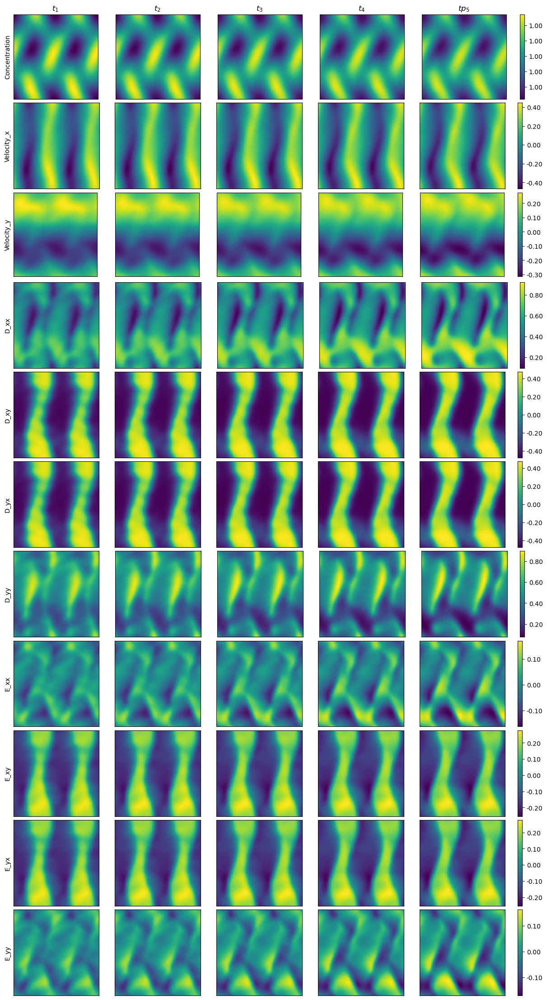

In [4]:
plot_datapoint(*test_data[42])

In [3]:
def predict_single(x, y):
    test_vrmse = 0.0
    model.eval()
    with torch.no_grad():
        x = x.unsqueeze(0)
        y = y.unsqueeze(0)
        x = x.to(device)
        y = y.to(device)

        pred = model(x)

        e_vrmse = vrmse(pred, y)
        x = x.cpu()
        y = y.cpu()
        pred = pred.cpu()

        x = x.squeeze(0)
        y = y.squeeze(0)
        pred = pred.squeeze(0)
        return pred, e_vrmse

In [6]:
x, y = test_data[42]
pred, test_vrmse = predict_single(x, y)
print(f"\nLearning rate {learning_rate}")
print(f"The prediction loss in VRMSE is: {test_vrmse:.6f}")


Learning rate 0.0005
The prediction loss in VRMSE is: 0.014674


In [7]:
# Test loop
test_vrmse = 0.0
model.eval()
with torch.no_grad():
    x, y = test_data[42]
    x = x.unsqueeze(0)
    y = y.unsqueeze(0)
    x = x.to(device)
    y = y.to(device)

    pred = model(x)

    test_vrmse = vrmse(pred, y)
    x = x.cpu()
    y = y.cpu()
    pred = pred.cpu()

    x = x.squeeze(0)
    y = y.squeeze(0)
    pred = pred.squeeze(0)

print(f"\nLearning rate {learning_rate}")
print(f"The prediction loss in VRMSE is: {test_vrmse:.6f}")


Learning rate 0.0005
The prediction loss in VRMSE is: 0.014674


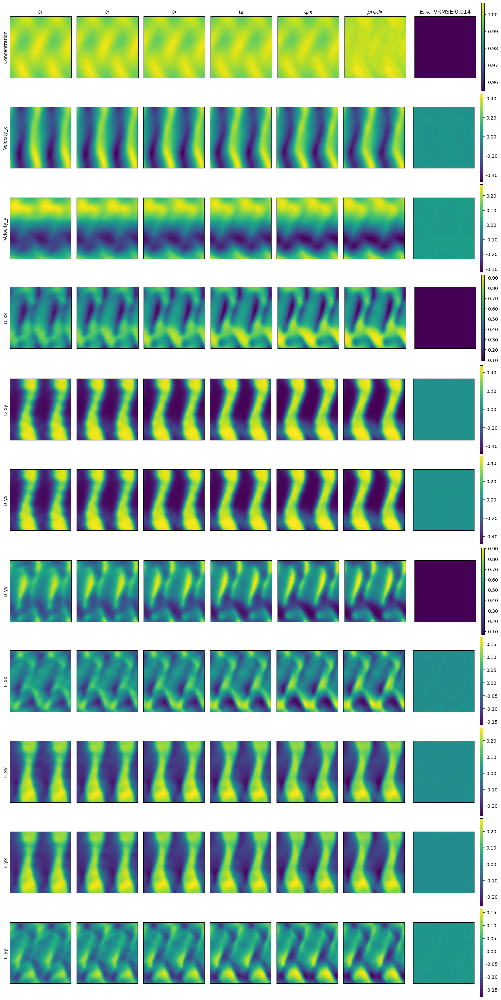

In [11]:
plot_pred_datapoint(x,y,pred)
# plt.title('Frame 41 out of 81 for the concentration field', fontsize=10)
plt.savefig("figures/Prediction_sample_U-Net.svg")
plt.show()
plt.close()

## Rollouts

In [4]:
test_data = MyDataset("test",xlen=81, ylen=0)
print(len(test_data))

26


In [5]:
def carry_single_roolout(x):
    len_x = len(x)
    pred = torch.zeros_like(x)
    errors = torch.zeros(x.shape[0])
    pred[:4] = x[:4]
    for i in range(len_x-4):
        y = x[4+i]
        y = y.unsqueeze(0)
        i_pred, i_vmrse = predict_single(pred[i:i+4],y)
        pred[i+4] = i_pred
        errors[i+4] = i_vmrse
    return pred, errors
    

In [15]:
# Roolout loop for the whole test dataset
VMRSE = []
for point in test_data:
    _, error = carry_single_roolout(point)
    VMRSE.append(error)

In [16]:
# Averaging errors over the whole test dataset 
errors_array = np.array(VMRSE)
error = np.mean(errors_array, axis=0)
std = np.std(errors_array, axis=0)

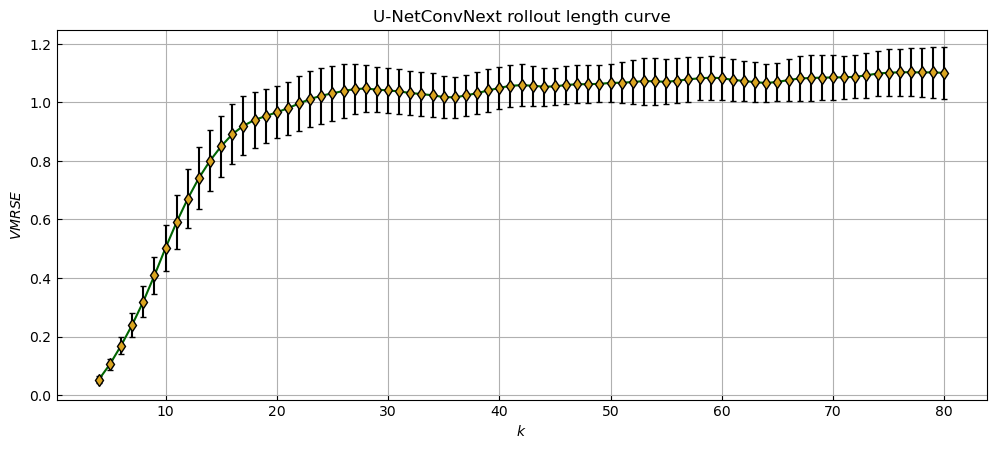

In [18]:
# Plot of rollout_length curve
fig, ax = plt.subplots(figsize=1*plt.figaspect(1/2.5))

ax.set_title('U-NetConvNext rollout length curve')
ax.errorbar(np.arange(len(error))[4:],  error[4:],color='darkgreen', yerr=std[4:]/2, fmt='-d', mfc='goldenrod', mec='k',capsize=2, ecolor='k')
ax.tick_params(axis='both', direction='in')
ax.set_xlabel('$k$')
ax.set_ylabel(r'$VMRSE$')
ax.grid(True, which='major', axis='both')

plt.show(fig)
fig.savefig('figures/Rollout_length_U-Net.svg',bbox_inches='tight')
plt.close(fig)

### Rollout concentration and velocity plots

In [8]:
point = test_data[15]
pred, error = carry_single_roolout(point)

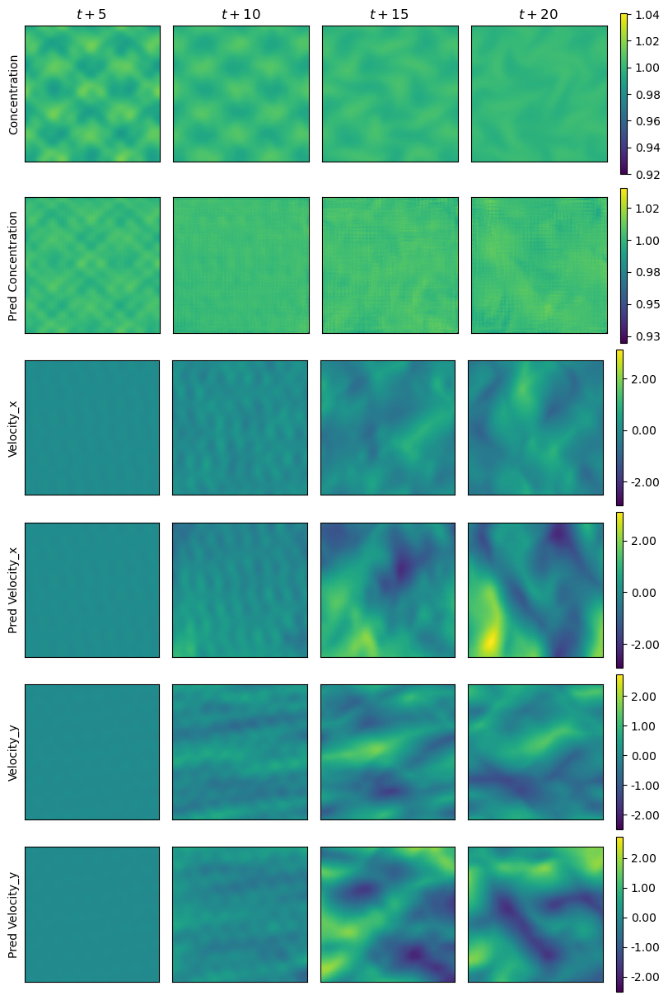

In [10]:
plot_rollout(point[:,:,:,:3],pred[:,:,:,:3], error)
plt.savefig("figures/Rollout_plots_U-Net.svg")
plt.show()
plt.close()

# ConvLSTM

In [4]:
model_dir = "checkpoints/ConvLSTM/"

# Loading the model
# Training parameters
lr_values = [5e-3]
HH = [16, 32, 64, 128, 256]
patience = 5  # Early stopping patience

# learning_rate = lr_values[-1]
for learning_rate in lr_values:
    print(f'Model lr = {learning_rate}')
    checkpoint_dir = model_dir+str(learning_rate)+'-'+"-".join([str(num) for num in HH])

    model = ConvLSTModel(input_dim=11, hidden_dims=HH, kernel_size=(3, 3)) # test night
    # model = ConvLSTModel(input_dim=11, hidden_dims=[32, 64, 96, 96], kernel_size=(3, 3), num_layers=4)
    criterion = nn.MSELoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    if os.path.exists(checkpoint_dir) and bool(os.listdir(checkpoint_dir)):
        check_numbers = []
        for filename in os.listdir(checkpoint_dir):
            if filename.endswith('pt'):
                check_numbers.append(int(filename[-6:-3]))
        epoch0 = max(check_numbers)
        
        checkpoint = torch.load(checkpoint_dir+f"/epoch_{epoch0:03d}.pt")

        
        model.load_state_dict(checkpoint['model_state_dict'])
        model = model.to(device)
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        print(f'epoch = {epoch0} loaded')
        epoch0 += 1


        train_losses = np.load(checkpoint_dir+'/train_losses.npy').tolist()
        val_losses = np.load(checkpoint_dir+'/val_losses.npy').tolist() 

        patience_counter = 0
        best_val_loss = min(val_losses)
        print(f'Best previous valitation loss = {best_val_loss}')
        val_i = -1
        if val_losses[val_i] == best_val_loss:
            patience_counter = 0  # Early stopping patience
        else:
            while val_losses[val_i] > best_val_loss:
                patience_counter += 1
                val_i-=1

    else:
        model = model.to(device)
        epoch0=1
        os.makedirs(checkpoint_dir, exist_ok=True)
        if not bool(os.listdir(checkpoint_dir)):
            print('Empty checkpoint directory')
        print(f'Starting at epoch = {epoch0}')
        train_losses = []
        val_losses = []
        best_val_loss = float('inf')
        patience_counter = 0

    print(f'Patience_counter = {patience_counter}')
    print('')

Model lr = 0.005


epoch = 11 loaded
Best previous valitation loss = 0.12030456754608214
Patience_counter = 2



d:\Jhon\miniconda3\envs\DA_ML\Lib\site-packages\torch\cuda\__init__.py:287: UserWarning: 
NVIDIA GeForce RTX 5060 Ti with CUDA capability sm_120 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 sm_80 sm_86 sm_90 compute_37.
If you want to use the NVIDIA GeForce RTX 5060 Ti GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(


In [5]:
test_data = MyDataset("test",xlen=4)
print(len(test_data))

# Bsize = 10
# test_loader = torch.utils.data.DataLoader(dataset=test_data, shuffle=False, batch_size=Bsize, num_workers=0)

2002


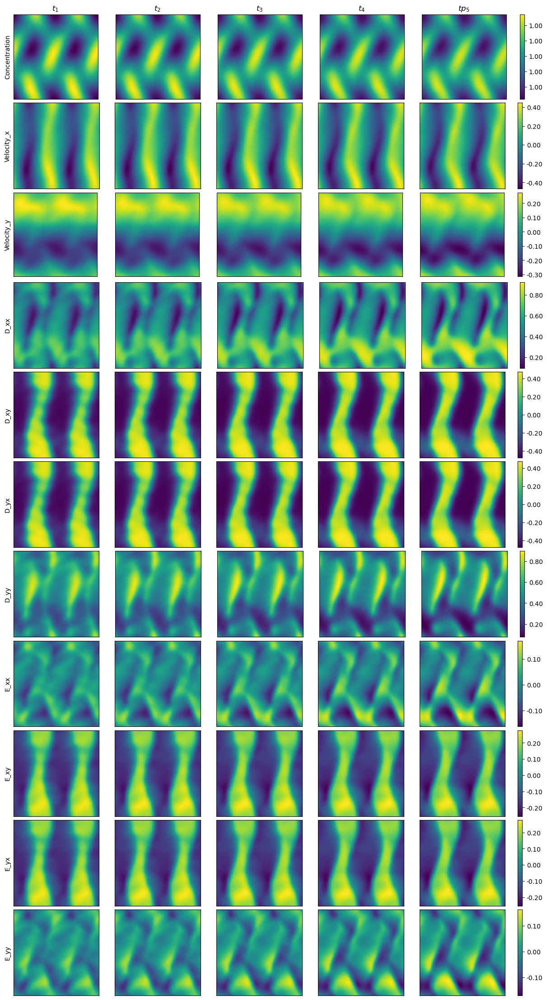

In [6]:
plot_datapoint(*test_data[42])

In [7]:
def predict_single(x, y):
    test_vrmse = 0.0
    model.eval()
    with torch.no_grad():
        x = x.unsqueeze(0)
        y = y.unsqueeze(0)
        x = x.to(device)
        y = y.to(device)

        pred = model(x)

        e_vrmse = vrmse(pred, y)
        x = x.cpu()
        y = y.cpu()
        pred = pred.cpu()

        x = x.squeeze(0)
        y = y.squeeze(0)
        pred = pred.squeeze(0)
        return pred, e_vrmse

In [8]:
x, y = test_data[42]
pred, test_vrmse = predict_single(x, y)
print(f"\nLearning rate {learning_rate}")
print(f"The prediction loss in VRMSE is: {test_vrmse:.6f}")


Learning rate 0.005
The prediction loss in VRMSE is: 0.576200


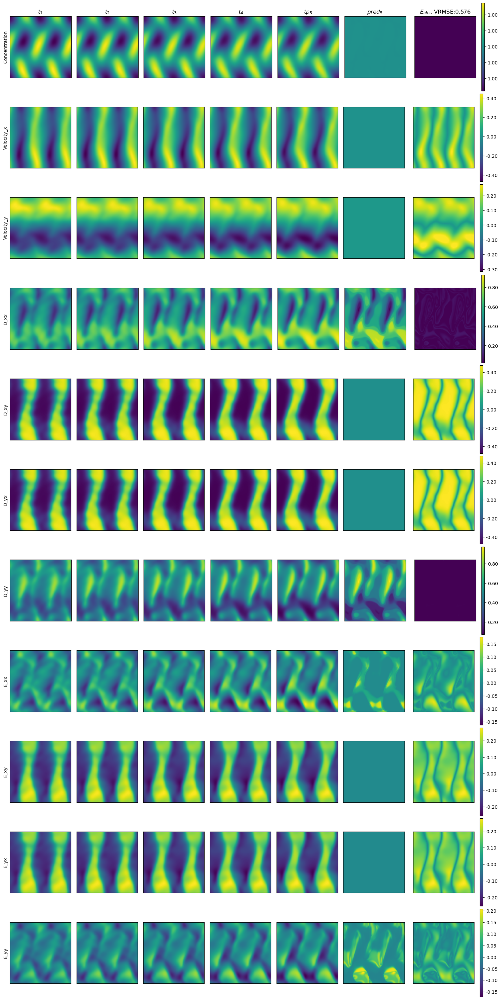

In [9]:
plot_pred_datapoint(x,y,pred)
# plt.title('Frame 41 out of 81 for the concentration field', fontsize=10)
plt.savefig("figures/Prediction_sample_ConvLSTM.svg")
plt.show()
plt.close()

## Rollouts

In [10]:
test_data = MyDataset("test",xlen=81, ylen=0)
print(len(test_data))

26


In [11]:
def carry_single_roolout(x):
    len_x = len(x)
    pred = torch.zeros_like(x)
    errors = torch.zeros(x.shape[0])
    pred[:4] = x[:4]
    for i in range(len_x-4):
        y = x[4+i]
        y = y.unsqueeze(0)
        i_pred, i_vmrse = predict_single(pred[i:i+4],y)
        pred[i+4] = i_pred
        errors[i+4] = i_vmrse
    return pred, errors
    

In [12]:
# Roolout loop for the whole test dataset
VMRSE = []
for point in test_data:
    _, error = carry_single_roolout(point)
    VMRSE.append(error)

In [13]:
# Averaging errors over the whole test dataset 
errors_array = np.array(VMRSE)
error = np.mean(errors_array, axis=0)
std = np.std(errors_array, axis=0)

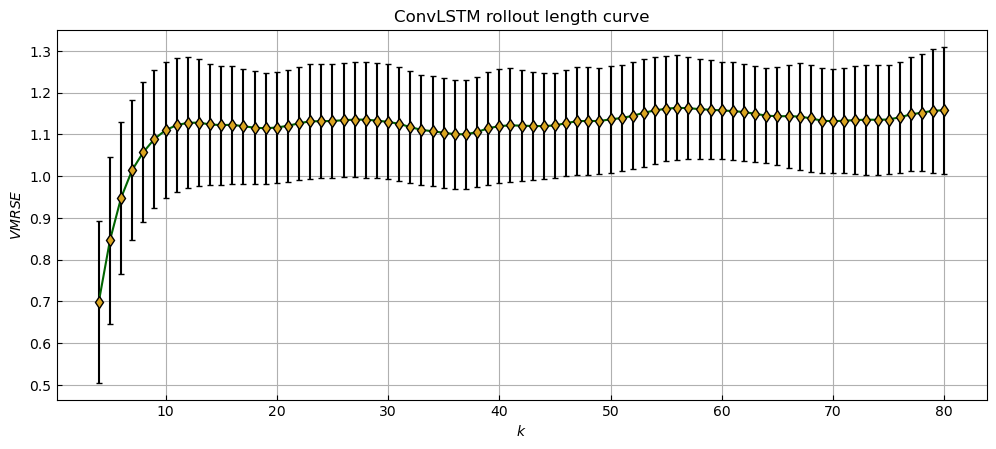

In [15]:
# Plot of rollout_length curve
fig, ax = plt.subplots(figsize=1*plt.figaspect(1/2.5))

ax.set_title('ConvLSTM rollout length curve')
ax.errorbar(np.arange(len(error))[4:],  error[4:],color='darkgreen', yerr=std[4:]/2, fmt='-d', mfc='goldenrod', mec='k',capsize=2, ecolor='k')
ax.tick_params(axis='both', direction='in')
ax.set_xlabel('$k$')
ax.set_ylabel(r'$VMRSE$')
ax.grid(True, which='major', axis='both')

plt.show(fig)
fig.savefig('figures/Rollout_length_ConvLSTM.svg',bbox_inches='tight')
plt.close(fig)

### Rollout concentration and velocity plots

In [16]:
point = test_data[15]
pred, error = carry_single_roolout(point)

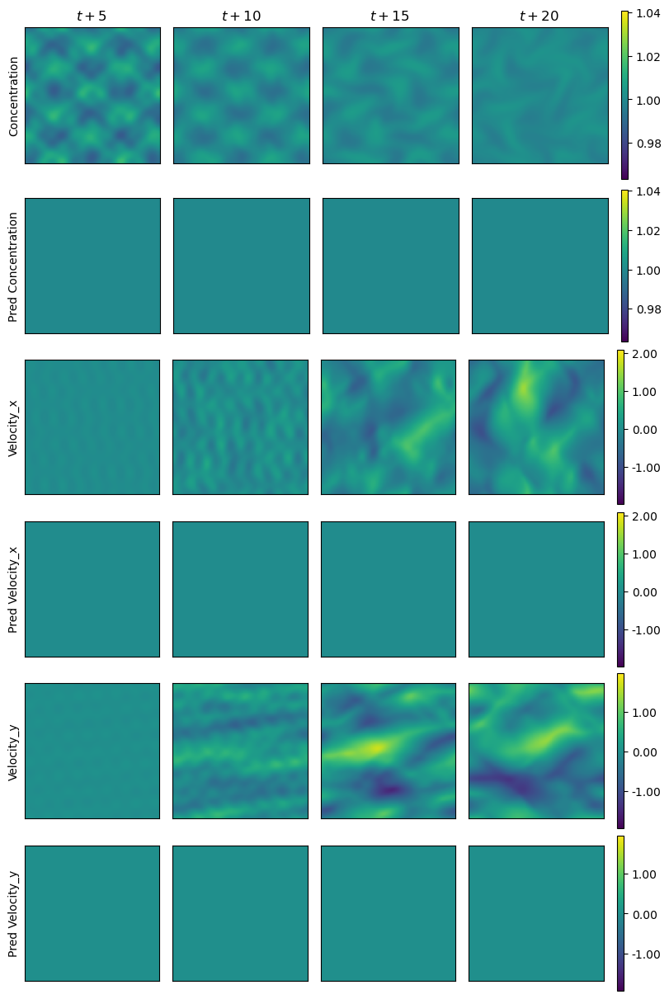

In [17]:
plot_rollout(point[:,:,:,:3],pred[:,:,:,:3], error)
plt.savefig("figures/Rollout_plots_ConvLSTM.svg")
plt.show()
plt.close()